In [3]:
from keras import backend as K
from keras.models import load_model
from keras.preprocessing import image
from keras.optimizers import Adam
import cv2
import numpy as np
from matplotlib import pyplot as plt

from models.keras_ssd300 import ssd_300
from keras_loss_function.keras_ssd_loss import SSDLoss
from keras_layers.keras_layer_AnchorBoxes import AnchorBoxes
from keras_layers.keras_layer_DecodeDetections import DecodeDetections
from keras_layers.keras_layer_DecodeDetectionsFast import DecodeDetectionsFast
from keras_layers.keras_layer_L2Normalization import L2Normalization

from ssd_encoder_decoder.ssd_output_decoder import decode_detections, decode_detections_fast

from data_generator.object_detection_2d_data_generator import DataGenerator
from data_generator.object_detection_2d_photometric_ops import ConvertTo3Channels
from data_generator.object_detection_2d_geometric_ops import Resize
from data_generator.object_detection_2d_misc_utils import apply_inverse_transforms

%matplotlib inline

from imageio import imread
from PIL import Image
from imutils.video import FPS
import time
import dlib
import os
import glob
import time
import pickle
import imutils
from tqdm import tqdm

Using TensorFlow backend.


# Create Dataset using SSD Model using SSD folder

## 1. Load SSD Model

In [3]:
# Set the image size.
img_height = 300
img_width = 300

In [4]:
# 1: Build the Keras model

K.clear_session() # Clear previous models from memory.

model = ssd_300(image_size=(img_height, img_width, 3),
                n_classes=20,
                mode='inference',
                l2_regularization=0.0005,
                scales=[0.1, 0.2, 0.37, 0.54, 0.71, 0.88, 1.05], # The scales for MS COCO are [0.07, 0.15, 0.33, 0.51, 0.69, 0.87, 1.05]
                aspect_ratios_per_layer=[[1.0, 2.0, 0.5],
                                         [1.0, 2.0, 0.5, 3.0, 1.0/3.0],
                                         [1.0, 2.0, 0.5, 3.0, 1.0/3.0],
                                         [1.0, 2.0, 0.5, 3.0, 1.0/3.0],
                                         [1.0, 2.0, 0.5],
                                         [1.0, 2.0, 0.5]],
                two_boxes_for_ar1=True,
                steps=[8, 16, 32, 64, 100, 300],
                offsets=[0.5, 0.5, 0.5, 0.5, 0.5, 0.5],
                clip_boxes=False,
                variances=[0.1, 0.1, 0.2, 0.2],
                normalize_coords=True,
                subtract_mean=[123, 117, 104],
                swap_channels=[2, 1, 0],
                confidence_thresh=0.5,
                iou_threshold=0.45,
                top_k=200,
                nms_max_output_size=400)

# 2: Load the trained weights into the model.
weights_path = 'pretrained_weights/VGG_VOC0712_SSD_300x300_iter_120000.h5'

model.load_weights(weights_path, by_name=True)

# 3: Compile the model so that Keras won't complain the next time you load it.
adam = Adam(lr=0.001, beta_1=0.9, beta_2=0.999, epsilon=1e-08, decay=0.0)
ssd_loss = SSDLoss(neg_pos_ratio=3, alpha=1.0)

model.compile(optimizer=adam, loss=ssd_loss.compute_loss)

W0708 17:27:31.853810 41676 module_wrapper.py:139] From C:\Users\abhinav.jhanwar\AppData\Local\Continuum\anaconda3\lib\site-packages\keras\backend\tensorflow_backend.py:95: The name tf.reset_default_graph is deprecated. Please use tf.compat.v1.reset_default_graph instead.

W0708 17:27:31.855218 41676 module_wrapper.py:139] From C:\Users\abhinav.jhanwar\AppData\Local\Continuum\anaconda3\lib\site-packages\keras\backend\tensorflow_backend.py:98: The name tf.placeholder_with_default is deprecated. Please use tf.compat.v1.placeholder_with_default instead.

W0708 17:27:32.807790 41676 module_wrapper.py:139] From C:\Users\abhinav.jhanwar\AppData\Local\Continuum\anaconda3\lib\site-packages\keras\backend\tensorflow_backend.py:102: The name tf.get_default_graph is deprecated. Please use tf.compat.v1.get_default_graph instead.

W0708 17:27:32.807790 41676 module_wrapper.py:139] From C:\Users\abhinav.jhanwar\AppData\Local\Continuum\anaconda3\lib\site-packages\keras\backend\tensorflow_backend.py:51

## 2. Load Data for ssd/dlib

In [ ]:
images_folder = 'objects/'
images = glob.glob(os.path.join(images_folder, "*.jpg"))

orig_images = [] # Store the images here.
input_images = [] # Store resized versions of the images here.
dlib_images_all = [] # Store image arrays of dlib loaded images


for img_path in tqdm(images):
    dlib_images_all.append(dlib.load_rgb_image(img_path))
    orig_images.append(imread(img_path))
    img = image.load_img(img_path, target_size=(img_height, img_width))
    img = image.img_to_array(img) 
    input_images.append(img)
input_images = np.array(input_images)

## 3. Make predictions with ssd and store in dlib format

In [120]:
y_pred = model.predict(input_images)

In [147]:
confidence_threshold = 0.5
dlib_boxes = [] # store bounding boxes of predictions
dlib_images = []

y_pred_thresh = [y_pred[k][y_pred[k,:,1] > confidence_threshold] for k in range(y_pred.shape[0])]

np.set_printoptions(precision=2, suppress=True, linewidth=90)
print("Predicted boxes:\n")
print('   xmin   ymin   xmax   ymax   aspect_ratio      area')
for i, pred in enumerate(y_pred_thresh):
    boxes_img = []
    frame = cv2.imread(images[i])
    for box in pred:
        if len(box)>0:
            left = max(int(box[2] * orig_images[i].shape[1] / img_width), 0)
            top = max(int(box[3] * orig_images[i].shape[0] / img_height), 0)
            right = int(box[4] * orig_images[i].shape[1] / img_width)
            bottom = int(box[5] * orig_images[i].shape[0] / img_height)
            #if ((right-left)/(bottom-top)) > 1 and ((right-left)*(bottom-top)>400) and ((right-left)/(bottom-top))<1.2:
            if ((right-left)/(bottom-top)) > 1 and ((right-left)*(bottom-top)>400):
                boxes_img.append(dlib.rectangle(left=left, top=top, right=right, bottom=bottom))
                draw_predict(frame, left, top, right, bottom, label='car', conf=box[1])
                print(left, '\t', top, '\t', right, '\t', bottom, '\t', round((right-left)/(bottom-top), 6), '\t', (right-left)*(bottom-top))
    if len(boxes_img)>0:
        cv2.imwrite('cars_ssd/{0}.jpg'.format((i)), frame)
        dlib_boxes.append(boxes_img)
        dlib_images.append(dlib_images_all[i])

Predicted boxes:

   xmin   ymin   xmax   ymax   aspect_ratio      area
0 	 4 	 61 	 61 	 1.0701754385964912 	 3477
0 	 1 	 64 	 58 	 1.1228070175438596 	 3648
1 	 2 	 64 	 57 	 1.1454545454545455 	 3465
0 	 2 	 62 	 58 	 1.1071428571428572 	 3472
0 	 4 	 64 	 62 	 1.103448275862069 	 3712
0 	 3 	 63 	 63 	 1.05 	 3780
0 	 5 	 63 	 62 	 1.105263157894737 	 3591
0 	 2 	 64 	 59 	 1.1228070175438596 	 3648
1 	 1 	 62 	 58 	 1.0701754385964912 	 3477
0 	 2 	 63 	 61 	 1.0677966101694916 	 3717
0 	 5 	 64 	 62 	 1.1228070175438596 	 3648
0 	 0 	 63 	 59 	 1.0677966101694916 	 3717
0 	 1 	 63 	 57 	 1.125 	 3528
0 	 1 	 63 	 59 	 1.0862068965517242 	 3654
0 	 8 	 64 	 62 	 1.1851851851851851 	 3456
0 	 3 	 60 	 55 	 1.1538461538461537 	 3120
0 	 3 	 63 	 57 	 1.1666666666666667 	 3402
0 	 0 	 60 	 58 	 1.0344827586206897 	 3480
0 	 1 	 64 	 59 	 1.103448275862069 	 3712
0 	 0 	 63 	 59 	 1.0677966101694916 	 3717
0 	 8 	 64 	 63 	 1.1636363636363636 	 3520
0 	 5 	 63 	 62 	 1.10526315789473

## 4. Visualize the predictions

We just resized the input image above and made predictions on the distorted image. We'd like to visualize the predictions on the image in its original size though, so below we'll transform the coordinates of the predicted boxes accordingly.

In [150]:
def draw_predict(frame, left, top, right, bottom, label, conf=-1):
    # Draw a bounding box.
    cv2.rectangle(frame, (left, top), (right, bottom), COLOR_YELLOW, 2)

    text = '{}: {:.2f}'.format(label, conf)

    # Display the label at the top of the bounding box
    label_size, base_line = cv2.getTextSize(text, cv2.FONT_HERSHEY_SIMPLEX, 2, 2)

    top = max(top, label_size[1])
    cv2.putText(frame, text, (left, top - 4), cv2.FONT_HERSHEY_SIMPLEX, 1.5,
                COLOR_WHITE, 3)
    
    
# Default colors
COLOR_BLUE = (255, 0, 0)
COLOR_GREEN = (0, 255, 0)
COLOR_RED = (0, 0, 255)
COLOR_WHITE = (255, 255, 255)
COLOR_YELLOW = (0, 255, 255)

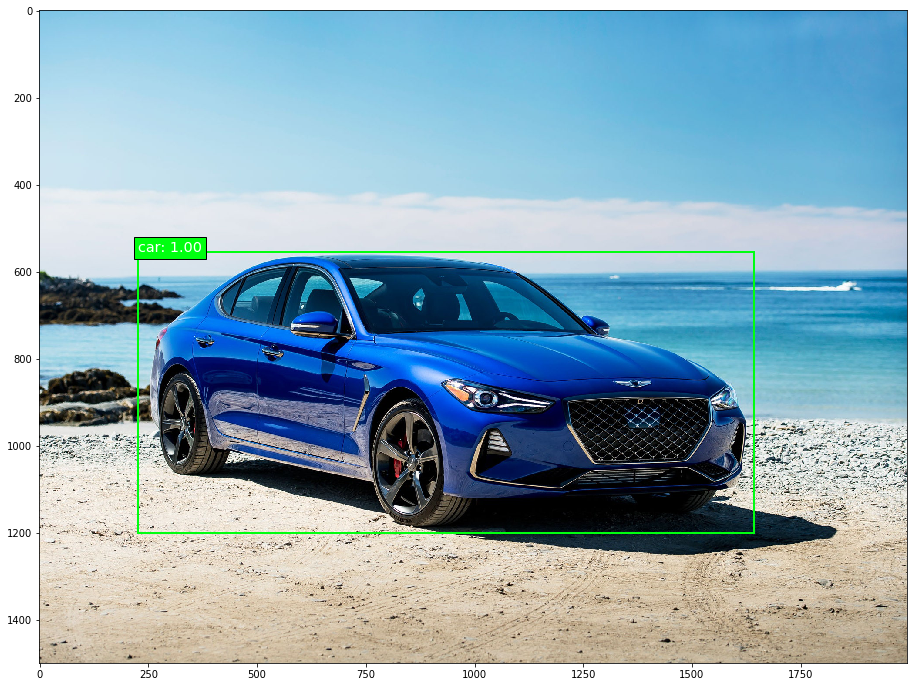

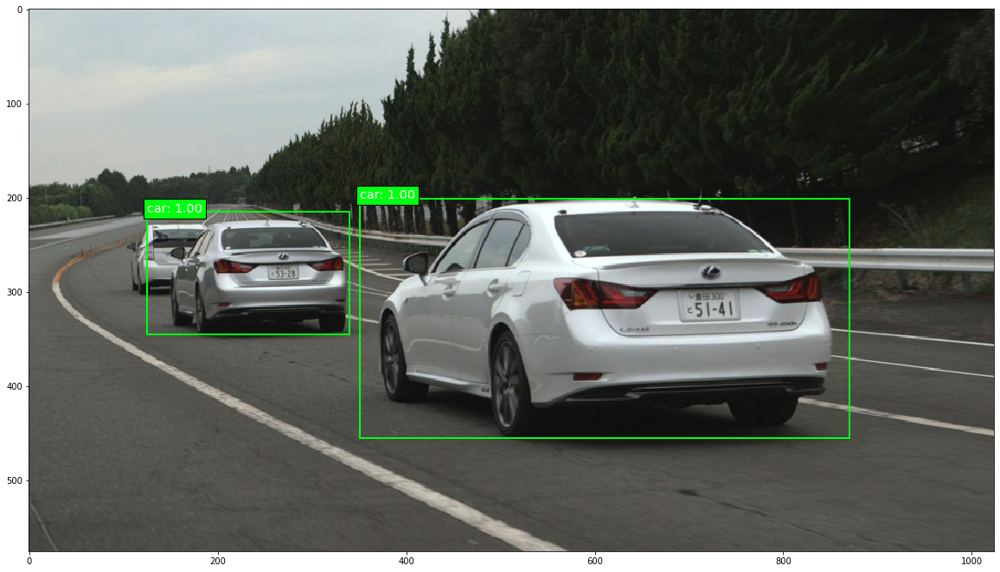

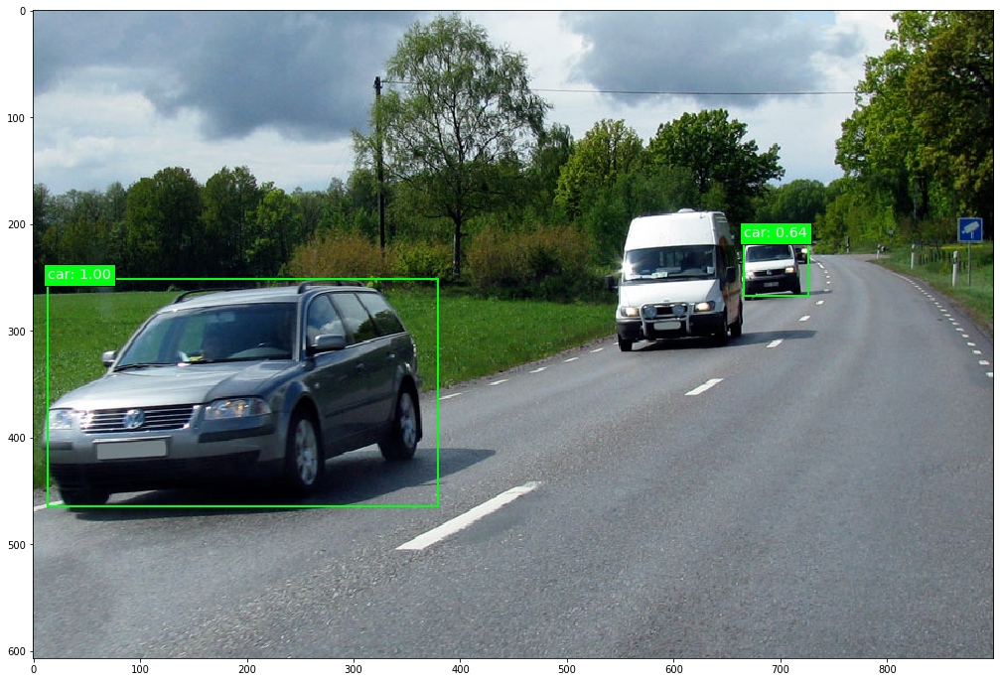

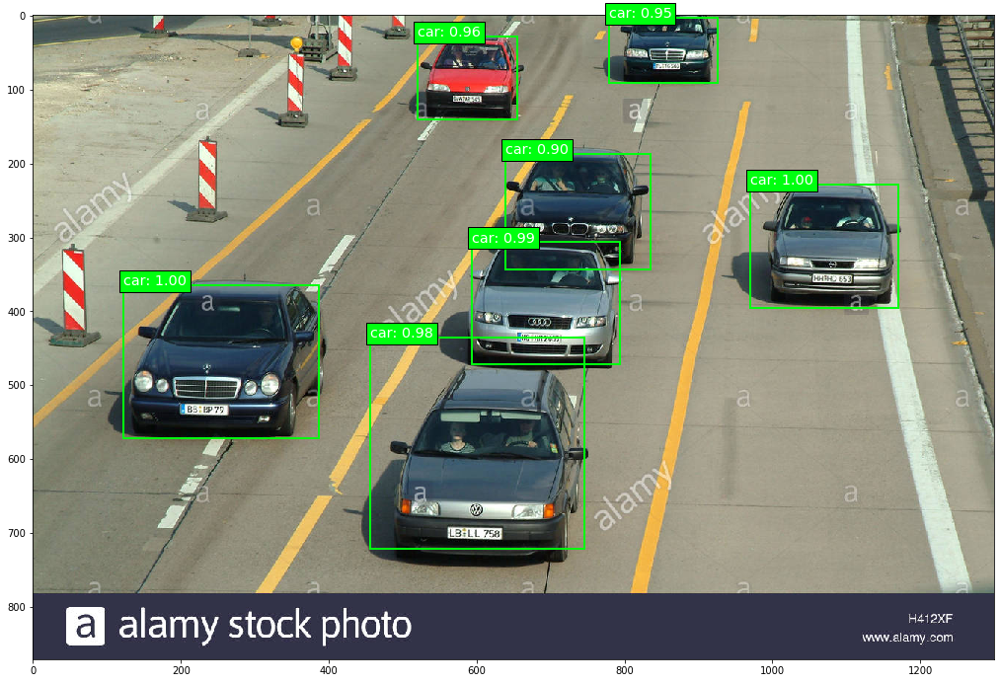

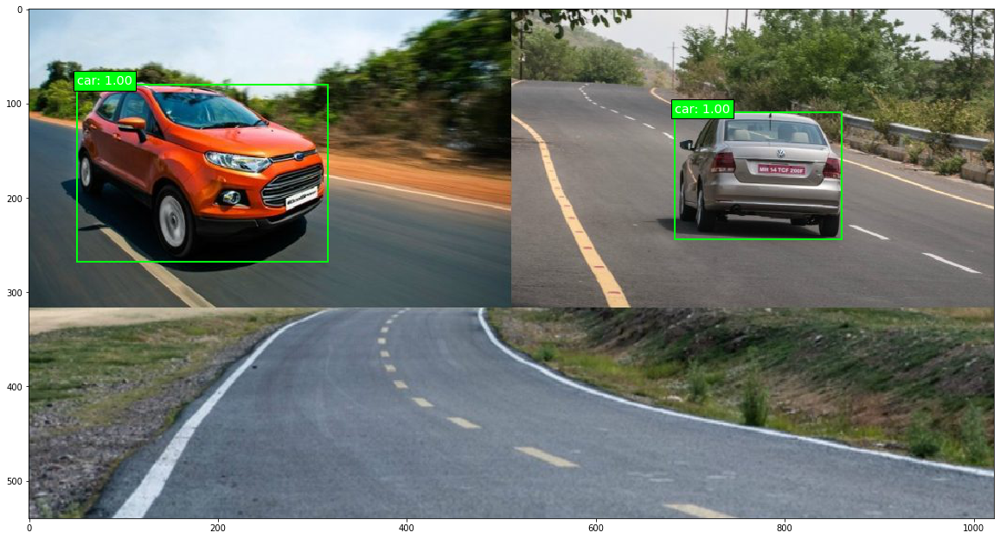

...

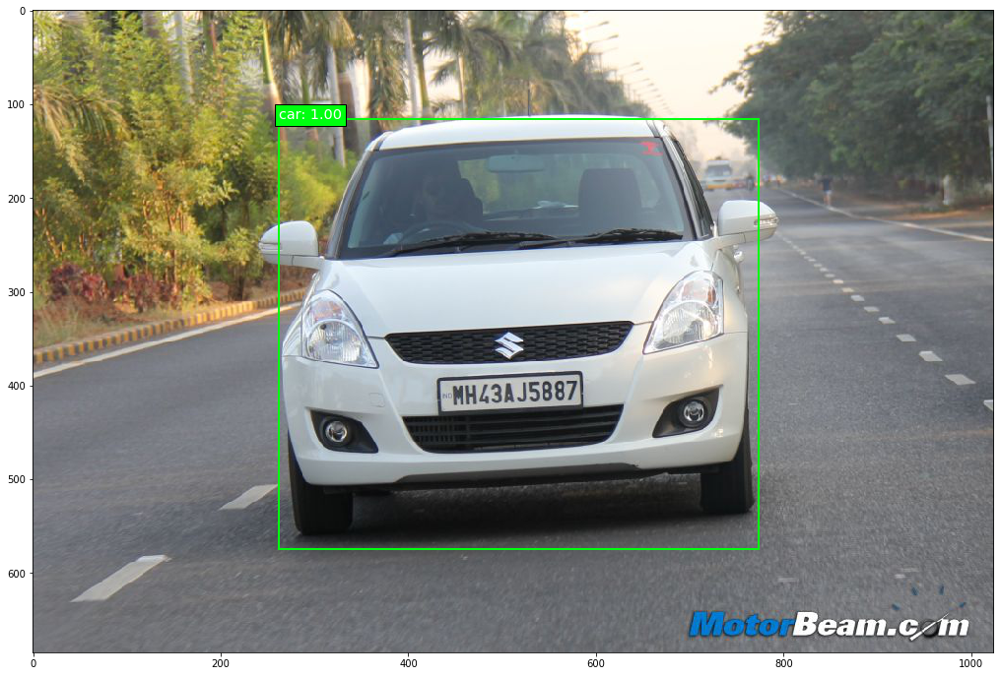

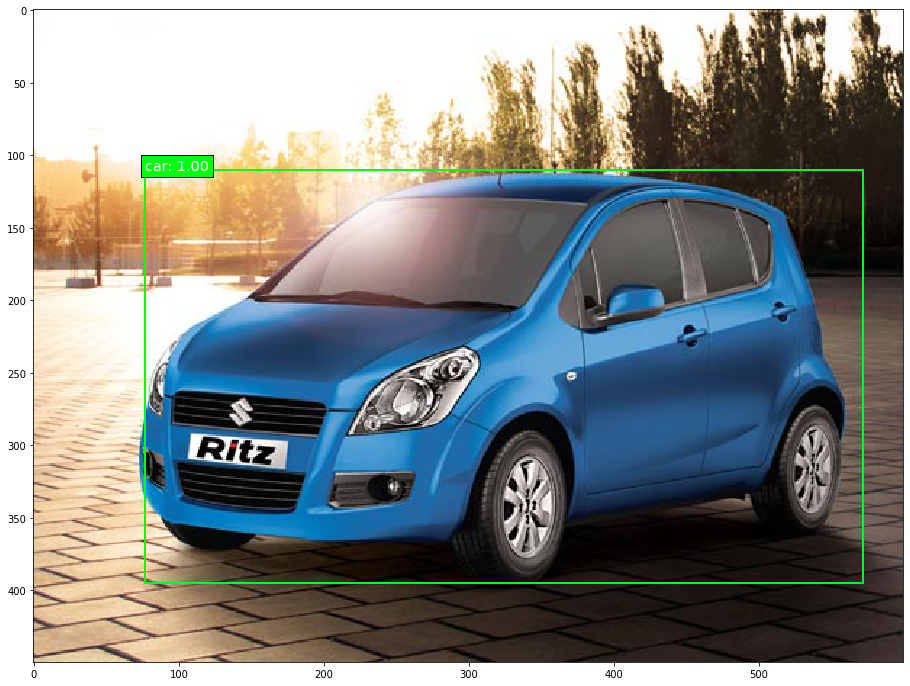

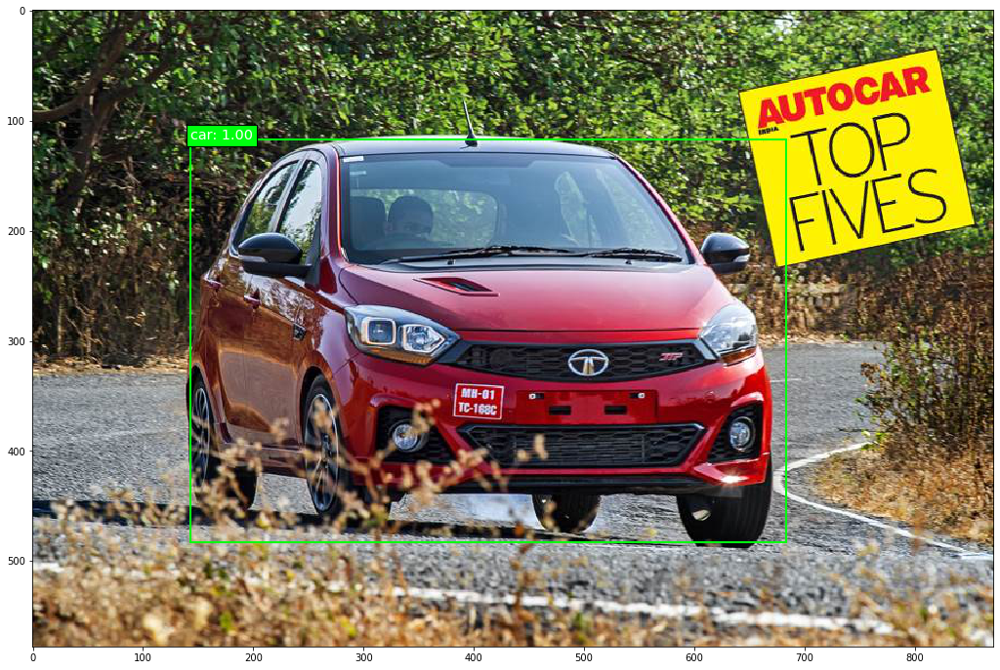

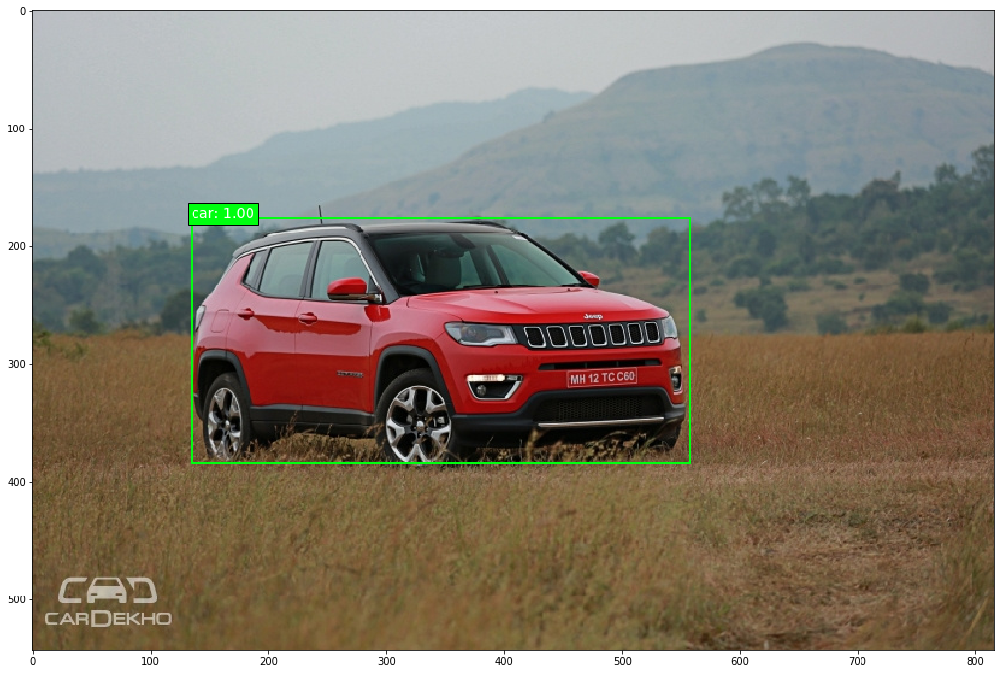

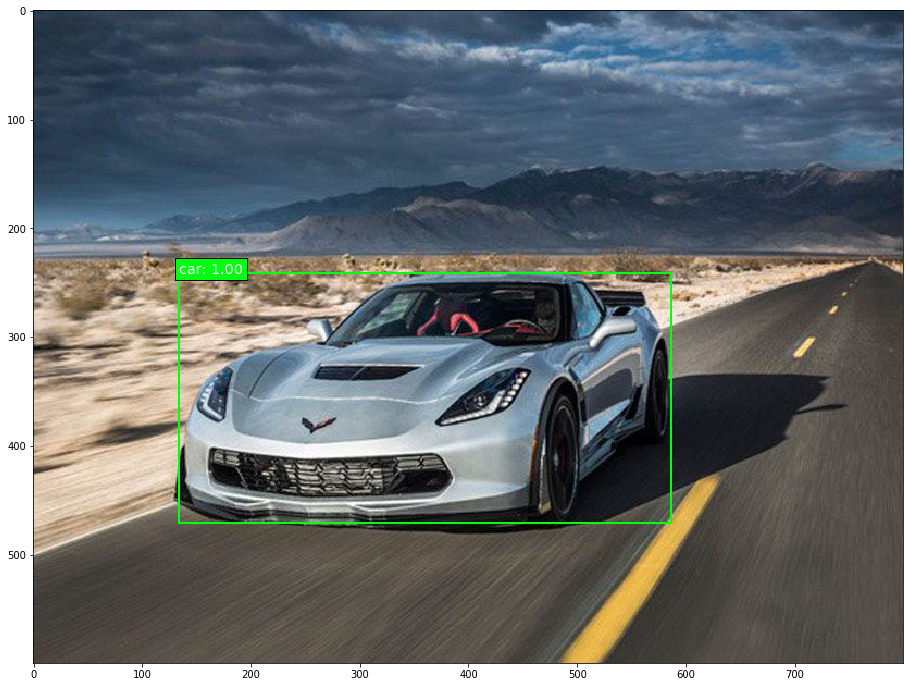

In [58]:
# Display the image and draw the predicted boxes onto it.

# Set the colors for the bounding boxes
colors = plt.cm.hsv(np.linspace(0, 1, 21)).tolist()
classes = ['background',
           'aeroplane', 'bicycle', 'bird', 'boat',
           'bottle', 'bus', 'car', 'cat',
           'chair', 'cow', 'diningtable', 'dog',
           'horse', 'motorbike', 'person', 'pottedplant',
           'sheep', 'sofa', 'train', 'tvmonitor']

for i, pred in enumerate(y_pred_thresh):
    plt.figure(figsize=(20,12))
    plt.imshow(orig_images[i])
    current_axis = plt.gca()
    for box in pred:
        # Transform the predicted bounding boxes for the 300x300 image to the original image dimensions.
        xmin = box[2] * orig_images[i].shape[1] / img_width
        ymin = box[3] * orig_images[i].shape[0] / img_height
        xmax = box[4] * orig_images[i].shape[1] / img_width
        ymax = box[5] * orig_images[i].shape[0] / img_height
        if (xmax-xmin)/(ymax-ymin) > 1:
            color = colors[int(box[0])]
            label = '{}: {:.2f}'.format(classes[int(box[0])], box[1])
            current_axis.add_patch(plt.Rectangle((xmin, ymin), xmax-xmin, ymax-ymin, color=color, fill=False, linewidth=2))  
            current_axis.text(xmin, ymin, label, size='x-large', color='white', bbox={'facecolor':color, 'alpha':1.0})
    plt.show()

# Training dlib model

software- https://imglab.in/# <br>
dataset- https://ai.stanford.edu/~jkrause/cars/car_dataset.html<br>
model- http://dlib.net/train_object_detector.py.html

In [152]:
options = dlib.simple_object_detector_training_options()
options.add_left_right_image_flips = True
options.C = 5 # Specify penalty parameter, too large - overfit, too small - underfit
options.num_threads = 2
options.be_verbose = True

# train_simple_object_detector().
detector = dlib.train_simple_object_detector(dlib_images, dlib_boxes, options)

print("\nTraining accuracy: {}".format(
    dlib.test_simple_object_detector(dlib_images, dlib_boxes, detector)))

# save detector
detector.save('detector_s_ai.svm')


Training accuracy: precision: 0.991597, recall: 0.991597, average precision: 0.990326


# Predicting using dlib model

In [ ]:
images_folder = "objects/"
print("Showing detections on the images in the images folder...")
detector = dlib.simple_object_detector("detector_s_ai.svm")
#detector = dlib.fhog_object_detector("detector_s_ai.svm")
    
win = dlib.image_window()
for i, f in enumerate(glob.glob(os.path.join(images_folder, "*.jpg"))):
    frame = cv2.imread(f) #imutils.resize(cv2.imread(f), 600)
    print("Processing file: {}".format(f))
    img = dlib.load_rgb_image(f)#imutils.resize(dlib.load_rgb_image(f), 600)
    win_det.set_image(detector)
    #dets = dlib.fhog_object_detector.run(detector, img)[0]
    dets = detector(img)
    print("Number of objects detected: {}".format(len(dets)))
    for k, d in enumerate(dets):
        #print("Detection {}: Left: {} Top: {} Right: {} Bottom: {}".format(
        #    k, d.left(), d.top(), d.right(), d.bottom()))
        draw_predict(frame, d.left(), d.top(), d.right(), d.bottom(), label='car')

    cv2.imwrite('cars_dlib/{0}.jpg'.format((i)), frame)
    frame = imutils.resize(frame, min(frame.shape[1], 600))
    cv2.imshow('object detection dlib', frame)
    cv2.waitKey(0)
   